# Рынок заведений общественного питания Москвы.  
  
 Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.  
 Формат кофейни - крутая и доступная, как «Central Perk» из известного сериала «Друзья».

#### `Цель:` Подготовить исследование рынка общественного питания Москвы из открытых источников для выбора подходящего инвесторам места, типа и класса заведения. 

#### `Задача:` Найти интересные особенности разных локаций, изучить рынок кофеен и возможность открытия заведения этой категории, дать рекомендации для выбора подходящего инвесторам места.   
  
**Подготовить полученные результаты в виде презентации**

#### `Основные вопросы исследования:` 
- анализ по:  
   - категориям заведения  
   - количество посадочных мест в местах по категориям  
   - соотношению сетевых и несетевых заведений   
   - административным районам Москвы  
   - значениям средних чеков заведений  
- построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района   
- отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium  
- найти топ-15
   - популярных сетей в Москве  
   - улиц по количеству заведений  
- детализировать исследование на предмет открытия кофейни  
- подготовить презентацию  
  
#### `Данные:` Составленны на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.  
Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

  #### `Описание данных:`   
     
 ##### `Файл /datasets/moscow_places.csv.:`  
  
`EventName` —  название события  
 `name` — название заведения;  
`address` — адрес заведения;  
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
`hours` — информация о днях и часах работы;  
`lat` — широта географической точки, в которой находится заведение;  
`lng` — долгота географической точки, в которой находится заведение;  
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  

   - «Средний счёт: 1000–1500 ₽»;  
   - «Цена чашки капучино: 130–220 ₽»;  
   - «Цена бокала пива: 400–600 ₽».  
   и так далее;  

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  

   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
   - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.   

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  

   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
   - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.    

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  

   0 — заведение не является сетевым   
   1 — заведение является сетевым   

`district` — административный район, в котором находится заведение, например Центральный административный округ;  
`seats` — количество посадочных мест.  

#### `Требования к исследованию:`  

Подготовить данные  
  
Изучить и проверить данные   
  
Детализировать исследование (месторасположение и количество кофеен, режим работы, рейтинг, средний чек)   

Сформулировать рекомендации по результатам исследования   

Подготовить презентацию в формате PDF  


## Часть 1. Изучение общей информации

### Загрузка данных

**Путь к файлу**

- /datasets/moscow_places.csv. [Скачать датасет](https://code.s3.yandex.net/datasets/moscow_places.csv.)

In [23]:
#импорт библиотек
import pandas as pd            
import scipy.stats as stats
from scipy import stats as st
import numpy as np 
import math as mth
import matplotlib.pyplot as plt   
plt.close("all")
from pandas.plotting import register_matplotlib_converters          
import warnings
import seaborn as sns 
from scipy import stats as st
import warnings 
import pathlib
from pathlib import Path
from plotly import graph_objects as go    
import plotly.express as px    
import folium
# импорт карты маркера и хороплета
from folium import Map, Marker, Choropleth
# импорт кластера
from folium.plugins import MarkerCluster
import re
import json

# не показывать предупреждения
from pandas.plotting import register_matplotlib_converters
import warnings
warnings.filterwarnings('ignore')

from termcolor import cprint # жирный шрифт

# конвертеры, которые позволяют использовать типы pandas в matplotlib  
register_matplotlib_converters()

pd.set_option('max_colwidth', None) # вывод всех символов в записях

In [24]:
# загрузка датасета

try:
    data = pd.read_csv('/datasets/moscow_places.csv')  # чтение файла с данными и сохранение в data
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')  
sns.set()


### Изучение данных

In [25]:
# функция для изучения данных
def df_analysis(df):
    print('_________________________________________________________________________________________________________')
    print(' ')
    cprint('Вывод 2 строк таблицы с начала и с конца с заголовками', 'green', attrs=['bold'])
    display(df.head(2), df.tail(2))
    print('_________________________________________________________________________________________________________')
    print(' ')
    cprint('Запрос всех атрибутов', 'green', attrs=['bold'])
    print(' ')
    print(df.info())
    print('_________________________________________________________________________________________________________')    
    print(' ')
    cprint('Числовое описание данных', 'green', attrs=['bold'])
    print(' ')
    print(df.describe().T.round(1))
    print('_________________________________________________________________________________________________________') 
    print(' ')
    cprint('Пропущенные значения', 'green', attrs=['bold'])
    print(' ')
    df_pass = pd.DataFrame(df.isna().sum().sort_values(ascending=False))
    df_pass.columns = ['pass']
    df_pass['perc, %'] = (df_pass['pass']/len(df)*100).round(1) 
    print(df_pass) 
    print('_________________________________________________________________________________________________________')
    print(' ')
    cprint('Количество явных дубликатов', 'green', attrs=['bold'])
    print(' ')
    print(df.duplicated().sum())
    print('_________________________________________________________________________________________________________')
    print(' ')
    cprint('Общая обзорная гистограмма для столбцов с числовыми данными', 'green', attrs=['bold'])
    print(' ')
    df.hist(figsize=(15, 10))
    plt.show()
    print('_________________________________________________________________________________________________________')

_________________________________________________________________________________________________________
 
Вывод 2 строк таблицы с начала и с конца с заголовками


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


_________________________________________________________________________________________________________
 
Запрос всех атрибутов
 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   f

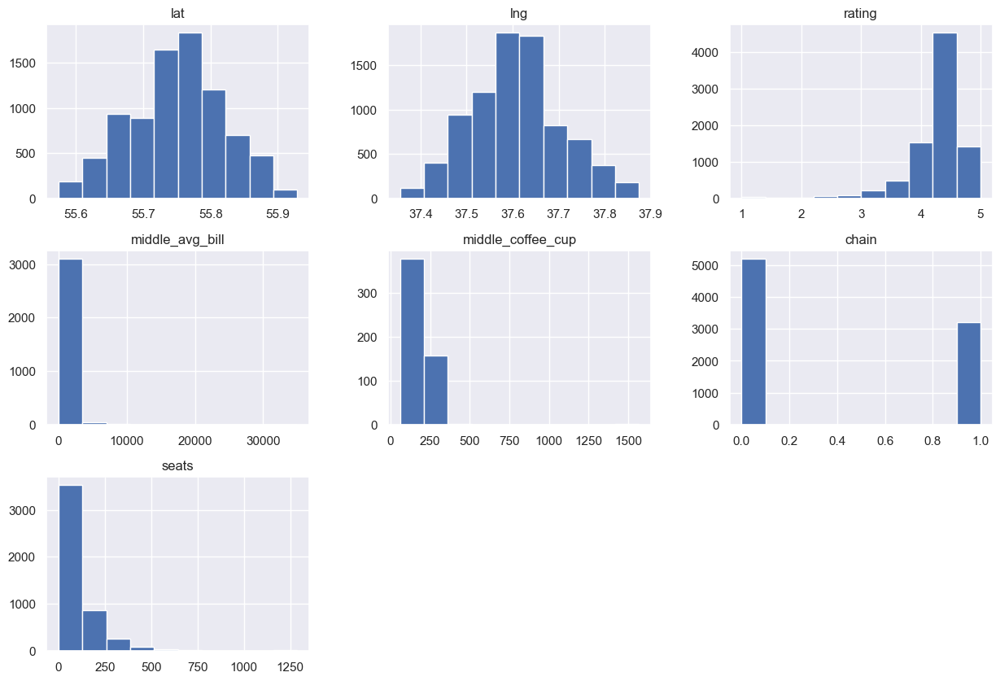

_________________________________________________________________________________________________________


In [26]:
df_analysis(data)

In [27]:
# код для просмотра уникальных значений
a = data['category'].unique()
#display(a)
display(sorted(a))

['бар,паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

In [28]:
b = data['district'].unique()
display(sorted(b))

['Восточный административный округ',
 'Западный административный округ',
 'Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Центральный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Южный административный округ']

#### Вывод по data:
  
- названия заголовков корректные  
- явных дубликатов не выявлено  
- неявных дубликатов в столбцах category, district нет
- преобразование форматов данных на первый вгляд не требуется  
- имеются пропущенные значения, необходимо исследовать
- столбцы: name, address, price, avg_bill к нижнему регистру 
- наблюдаются выбросы в данных по посадочным местам, оценкой среднего чека, оценкой чашечки капучино


## Часть 2. Подготовка данных

### Предобработка данных.

In [29]:
# приводим столбец к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data['price'] = data['price'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()

In [30]:
# выявление строк с одинаковыми параметрами: наименование, категория, адрес заведения
duplicate_rows = data[data.duplicated(['name', 'category', 'address'])]
print('Количество строк-дубликатов по адресам:', len(duplicate_rows))

Количество строк-дубликатов по адресам: 2


In [31]:
# очистка данных от строк-дубликатов
data = data.drop_duplicates(subset=['name', 'category', 'address'])

In [32]:
# работа с пропусками
omissions = data.isna().sum().sort_values(ascending=False).reset_index()
omissions.columns = ['column', 'count']
omissions['fraction,%'] = round(omissions['count']/ omissions['count'].sum() *100, 2)
omissions

,column,count,"fraction,%"
0,middle_coffee_cup,7869,29.20
1,middle_avg_bill,5255,19.50
2,price,5089,18.89
3,avg_bill,4588,17.03
4,seats,3610,13.40
5,hours,536,1.99
6,name,0,0.00
7,category,0,0.00
8,address,0,0.00
9,district,0,0.00


**middle_coffee_cup** - число с оценкой одной чашки капучино - 29%  
**middle_avg_bill**	- число с оценкой среднего чека - 19.5%  
**price** - категория цен в заведении -	19%   
**avg_bill** - средняя стоимость заказа в виде диапазона - 17%  
**seats** - количество посадочных мест - 13%  
**hours** - дни и часы работы - 2%  
Все данные предполагают ручной ввод, удаление пропущенных данных не требуется.  
Замена пропусков каким-либо расчётным значением (или 0) необоснована, может исказить результат (н-р, при подсчёте среднего значения) и повлиять на итоговый вывод. Пропуски без изменений, на результаты, даже если что-то потебуется подсчитать, это не повлияет.

### Добавление столбцов.

In [33]:
# проверка уникальных значений режима работы
data['hours'] = data['hours'].astype(str) # замена формата на строчный
c = data['hours'].unique()
#display(sorted(c))

In [34]:
# добавление улицы
data['street'] = data['address'].str.split(',').str[1]
data['street'] = data['street'].str.strip().str.replace("улица", '')

# добавление столбца с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная,False


#### Вывод:   
  
Данные подготовлены к работе  
- Пропущенных значений нет 
- Заголовки приведены к нижнему регистру   
- Дубликаты проработаны  
- Проанализированы пропуски, поставлены "заглушки"  
- Добавлены столбцы с улицей и режимом работы   

## Часть 3. Анализ данных

### Распределение количества заведений по категориям

In [35]:
print('Количество юридических образований:', data['name'].nunique())

# таблица с количеством объектов  по категориям и долями от общего числа
categorys = data['category'].value_counts().reset_index()
categorys.columns = ['column', 'count']
categorys['fraction,%'] = round(categorys['count'] / categorys['count'].sum() *100, 2).sort_values(ascending=False)
categorys

print('')
print('Количество заведений в исследовании:', len(data['name']))

Количество юридических образований: 5512

Количество заведений в исследовании: 8404


#### Гистограмма

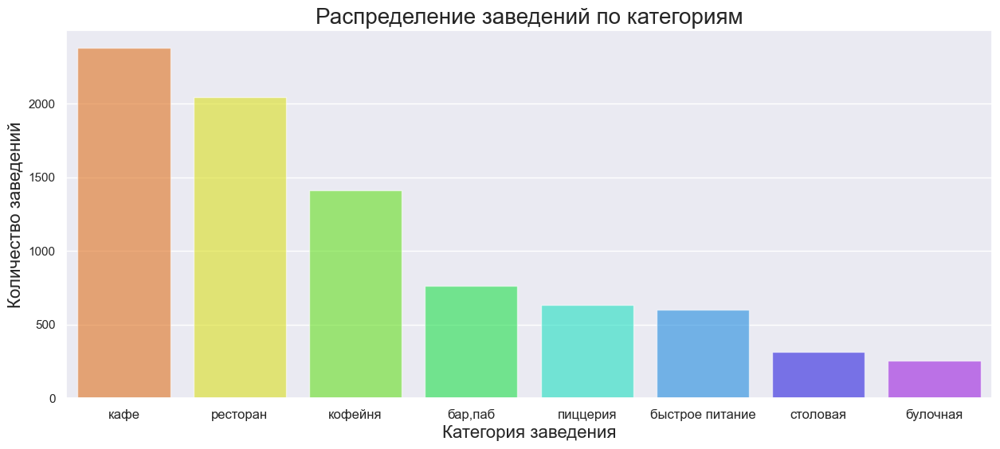

In [36]:
# визуализация распределения медианного количества посадочных мест по типам заведений 
hist_categ = data.groupby('category')['name'].count().reset_index().sort_values(
                                 by='name', ascending=False).round(0)
plt.figure(figsize=(15, 6))
ax = sns.barplot(x='category', y='name', data=hist_categ, palette='gist_rainbow', alpha = 0.6)
ax.set_title('Распределение заведений по категориям', fontsize=20)
ax.set_xlabel('Категория заведения', fontsize=16)
ax.set_ylabel('Количество заведений', fontsize=16)
plt.xticks(rotation=0, fontsize=12)

plt.show()

In [37]:
# визуализация распределения по категориям с указанием количества и доли (информационно для вывода)
fig = px.treemap(categorys, path=[px.Constant('column'), 'column'], values='count',
                  color='count', hover_data=['fraction,%'],
                  color_continuous_scale='Spectral_r',
                  width=700, height=200,
                  title="Древовидная диаграмма по типам заведений с указанием кол-ва и доли")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=15))

fig.show()

#### Вывод 1:   
  
В исследовании 5 512 юридический образований общепита.  
Количество заведений в исследовании: 8 404.  
Кафе - самая многочисленная категория заведений - 28%, практически рядом по доле рестораны - 24%, кофейни - 17%,  
быры, пиццерии, фастфуды составляют примерно одинаковую долю заведений - 7-9%, и наименее всего представлены столовые и булочные - 3-4%.

### Количество посадочных мест в заведениях по категориям

#### "Ящик с усами"

In [38]:
# получение датафрейма по посадочным местам без учёта пропущенных значений
data_seats = data[data['seats'] != 'NaN']

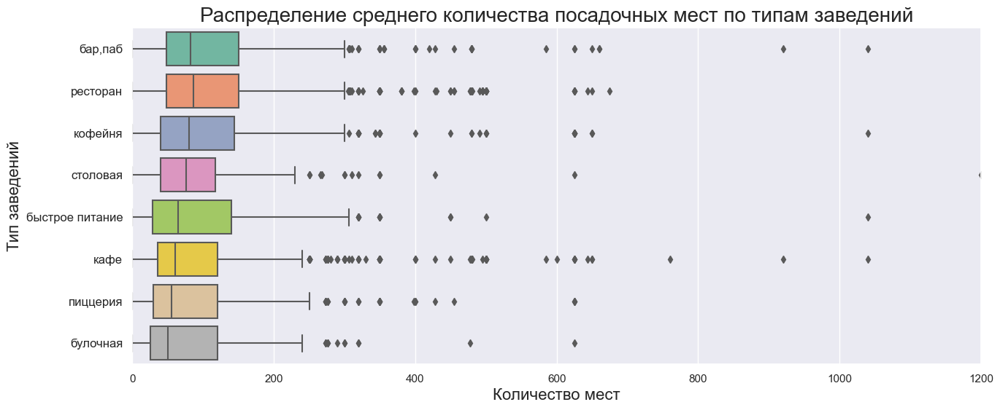

In [39]:
seats = data_seats.groupby(['category'])['seats'].mean().sort_values(ascending=False).index

# визуализация распределения среднего количества посадочных мест по типам заведений
plt.figure(figsize=(15, 6))
ax = sns.boxplot(data=data_seats, x='seats', y='category', palette='Set2', order = seats)
plt.xlim(0,1200)
plt.title('Распределение среднего количества посадочных мест по типам заведений', fontsize=20)
plt.xlabel('Количество мест', fontsize=16)
plt.ylabel('Тип заведений', fontsize=16)
plt.yticks(rotation=0, fontsize=12)
plt.show()

#### Сравнение среднего и медианного значений посадочных мест по категориям заведений

In [40]:
 # сводная таблица
seats_table = data_seats.pivot_table(
    index='category', values='seats', aggfunc=['sum', 'count', 'mean', 'median']).reset_index()
seats_table

,category,sum,count,mean,median
,,seats,seats,seats,seats
0,"бар,паб",58281.0,468,124.532051,82.5
1,булочная,13229.0,148,89.385135,50.0
2,быстрое питание,34513.0,349,98.891117,65.0
3,кафе,118770.0,1218,97.512315,60.0
4,кофейня,83511.0,751,111.199734,80.0
5,пиццерия,40350.0,427,94.496487,55.0
6,ресторан,154681.0,1269,121.892041,86.0
7,столовая,16359.0,164,99.750000,75.5


#### Гистограмма

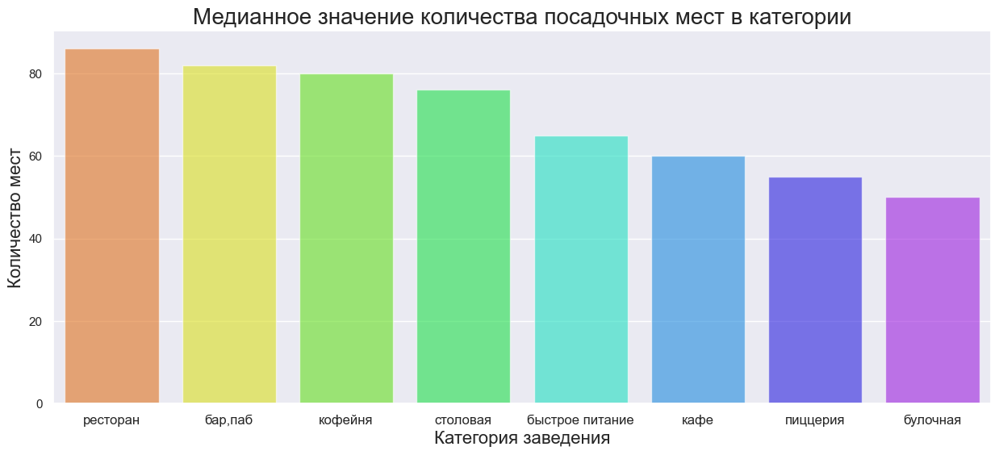

In [41]:
# визуализация распределения медианного количества посадочных мест по типам заведений 
seats1 = data_seats.groupby('category')['seats'].median().reset_index().sort_values(
                                 by='seats', ascending=False).round(0)
plt.figure(figsize=(15, 6))
ax = sns.barplot(x='category', y='seats', data=seats1, palette='gist_rainbow', alpha = 0.6)
ax.set_title('Медианное значение количества посадочных мест в категории', fontsize=20)
ax.set_xlabel('Категория заведения', fontsize=16)
ax.set_ylabel('Количество мест', fontsize=16)
plt.xticks(rotation=0, fontsize=12)

plt.show()

#### Вывод 2:  
На графике распределения ("ящик с усами") наблюдаются выбросы в данных (max = 1 200), поэтому правильнее будет ориентироваться на медианное значение посадочных мест.  
Самое большое количество находится в ресторанах (90), барах(84), кофейнях, столовых (80). Самыми малочисленными являются пиццерии (56) и булочные (52). 

### Соотношение сетевых и несетевых заведений

#### Круговая диаграмма

Text(0.5, 1.0, 'Распределение долей сетевых и несетевых заведений')

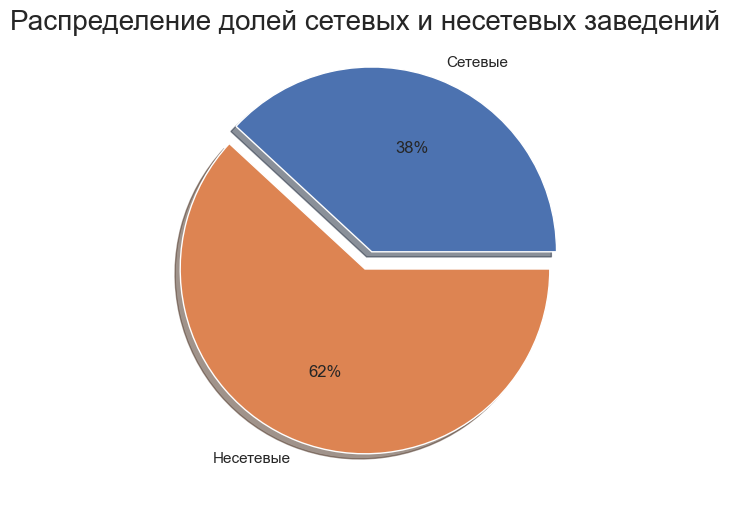

In [42]:
# получение данных по типам заведений без учёта пропущенных значений
n = ['Сетевые', 'Несетевые']
m = [data['chain'].sum(), len(data.loc[data['chain'] == 0]['name'])]
# визуализация 
plt.figure(figsize=(15, 6))
plt.pie(m, labels=n, 
        autopct='%1.0f%%',
        shadow=True,
        explode=(0.1,0));
plt.title('Распределение долей сетевых и несетевых заведений', fontsize=20)

#### Сравнение сетевых и несетевых заведений по категориям 

In [43]:
# получение данных по сетям
data_chain = data[data['chain'] != 0] # только сети
chains = data_chain.pivot_table(index='category', values='chain', aggfunc=['count']).reset_index()
chains.columns = ['category', 'сетевые']
chains1 = data[data['chain'] == 0].pivot_table(index='category', values='chain', aggfunc=['count']).reset_index()
chains1.columns = ['category', 'несетевые']
chains['несетевые'] = chains1['несетевые']
chains['fraction,%'] = round(chains['несетевые']/chains['сетевые']*100, 2)
display(chains.sort_values(by = 'несетевые', ascending=False))

print('Несетевых заведений больше чем сетевых на:', round(sum(chains['несетевые'])/sum(chains['сетевые'])*100, 1), '%')

,category,сетевые,несетевые,"fraction,%"
3,кафе,779,1598,205.13
6,ресторан,729,1313,180.11
4,кофейня,720,693,96.25
0,"бар,паб",169,596,352.66
2,быстрое питание,232,371,159.91
5,пиццерия,330,303,91.82
7,столовая,88,227,257.95
1,булочная,157,99,63.06


Несетевых заведений больше чем сетевых на: 162.3 %


#### Групповая столбчатая диаграмма

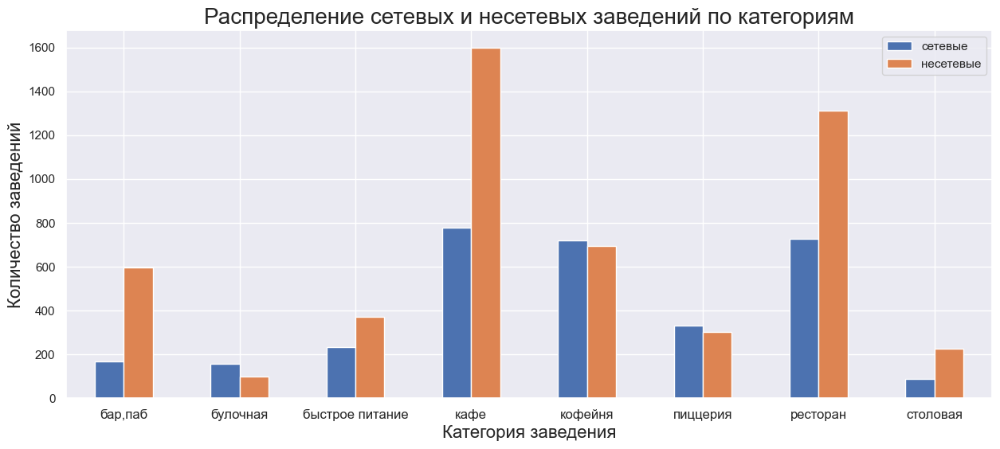

In [44]:
chains[['category', 'сетевые', 'несетевые']].plot.bar(x='category', figsize=(15, 6))

plt.title('Распределение сетевых и несетевых заведений по категориям', fontsize=20)
plt.xlabel('Категория заведения', fontsize=16)
plt.ylabel('Количество заведений', fontsize=16)
plt.xticks(rotation=0, fontsize=12)

plt.show()

#### Вывод 3:  
В общих цифрах количество **несетевых заведений больше чем сетевых на 162%.** Иначе говоря, **несетевых больше в 1,6 раз**.  

Лидерами по численности в обоих типах заведений являются **кафе**, к ним близки **рестораны**. Но в обоих категориях несетевых заведений больше примерно в 2 раза.  
**Кофейни и пиццерии** примерно поровну представлены как сетями, так и индивидуальными брендами.  
**Бары/пабы и столовые** преимущественно несетевые (в 3,5 - 2,6 раз больше, чем сетей), а вот **булочные** лучше развиваются сетями, количество сетевых точек почти в 2 раза больше, чем несетевых.

### Топ-15 популярных сетей в Москве.

#### Рейтинг заведений по убыванию

In [45]:
# получение данных по заведениям в порядке убывания
rank = data_chain.groupby('name').agg({'address' : 'count', 'rating': 'median', 'category' : pd.Series.mode})
rank = rank.rename(columns={'address':'count'})
rank = rank.sort_values('count', ascending = False).reset_index().head(15)
display(rank) 

print(' ')
print('Количество заведений в ТОП-15 сетей -', round(sum(rank['count']), 2), 'объектов.')
print(' ')
print('Доля сетевых заведений ТОП-15 составляет', round(sum(rank['count'])/len(data['name'])*100, 1), '% от общего количества.')

,name,count,rating,category
0,шоколадница,120,4.20,кофейня
1,домино'с пицца,76,4.20,пиццерия
2,додо пицца,74,4.30,пиццерия
3,one price coffee,71,4.20,кофейня
4,яндекс лавка,69,4.00,ресторан
5,cofix,65,4.10,кофейня
6,prime,50,4.20,ресторан
7,хинкальная,44,4.40,кафе
8,кофепорт,42,4.20,кофейня
9,кулинарная лавка братьев караваевых,39,4.40,кафе


 
Количество заведений в ТОП-15 сетей - 816 объектов.
 
Доля сетевых заведений ТОП-15 составляет 9.7 % от общего количества.


#### Горизонтальный столбиковый график

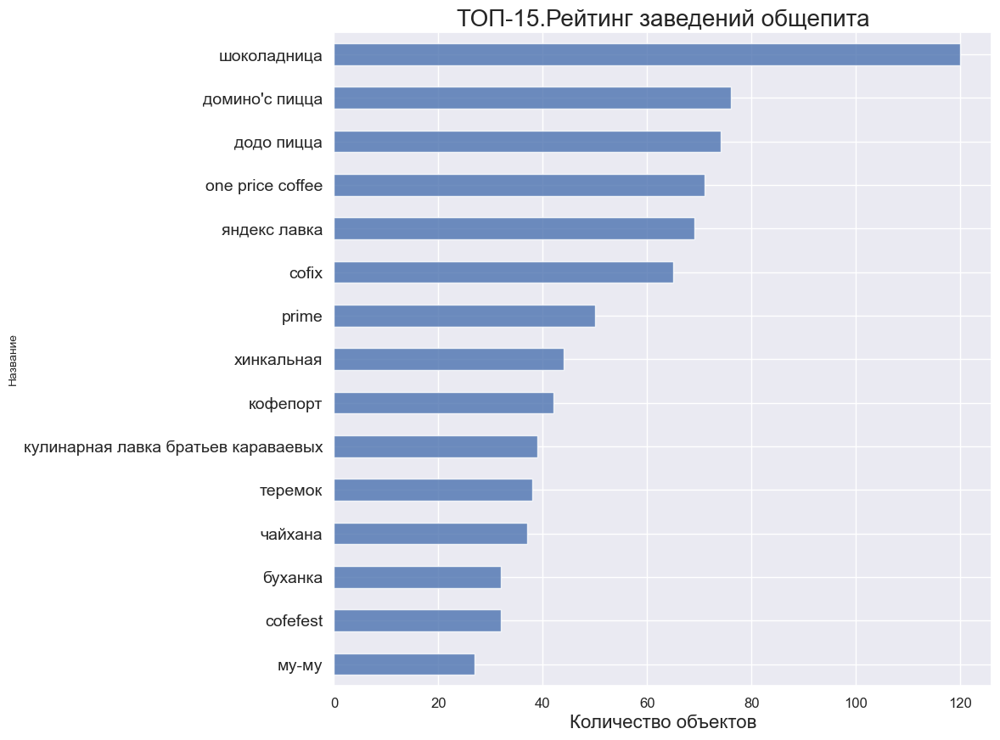

In [46]:
ax = rank.iloc[0:15, 0:2].sort_values(by='count', ascending=True).plot.barh (
    x='name', y='count', legend= False, alpha = 0.8, figsize=(10, 10))
ax.set_title('ТОП-15.Рейтинг заведений общепита', fontsize=20)
ax.set_xlabel('Количество объектов', fontsize=16)
ax.set_ylabel('Название', fontsize=10)
plt.xticks(fontsize=12)
plt.yticks(rotation=0, fontsize=14)
plt.show()

#### Вывод 4:  
Количество сетевых заведений в ТОП-15: 816 объектов, что составляет 9.7% от общего количества заведений общепита Москвы.  
Самой популярной сетью является кофейня "Шоколадница", она лидирует с большим отрывом. Замыкает ТОП сеть "Му-му", по кличеству меньше в 4,4 раза, чем лидер.    
Все заведения имеют высокую среднюю оценку посетителей (более 4) и рассчитаны на массового потребителя.    
Самые популярные заведения представлены преимущественно кафе, кофейнями и ресторанами, также присутствует самая распространённая сеть булочных "Буханка".

### Представленность по административным районам Москвы.

#### Общее количество заведений и количество заведений каждой категории по районам.

In [47]:
# получение общего количества заведений и их доля в общей сумме в порядке убывания
district = data.groupby('district').agg({'seats' : 'sum', 'address' : 'count'}).reset_index().rename(
    columns={'address':'count'}).sort_values(by = 'count', ascending=False)
district['fraction,%'] = round(district['count'] / district['count'].sum() *100, 2)
district


,district,seats,count,"fraction,%"
5,Центральный административный округ,143765.0,2242,26.68
2,Северный административный округ,62227.0,898,10.69
8,Южный административный округ,62323.0,892,10.61
3,Северо-Восточный административный округ,49900.0,891,10.60
1,Западный административный округ,74237.0,851,10.13
0,Восточный административный округ,34784.0,798,9.50
6,Юго-Восточный административный округ,28732.0,714,8.50
7,Юго-Западный административный округ,38208.0,709,8.44
4,Северо-Западный административный округ,25518.0,409,4.87


In [48]:
# получение количества заведений каждой категории по районам
data_district = pd.pivot_table(data,
               index=['district'],
               values=['address'],
               columns=['category'],            
               aggfunc=['count']).reset_index()

data_district.columns = ['district', 'бар/паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
data_district 

,district,бар/паб,булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,239,150,71,218,24
2,Северный административный округ,68,39,58,234,193,77,188,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


#### Горизонтальный график с накоплением

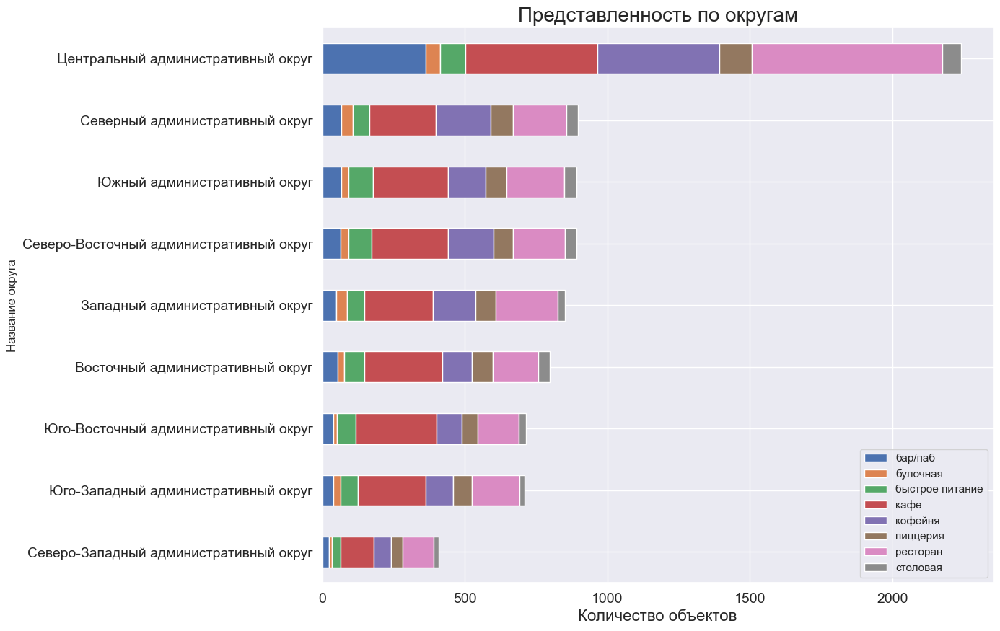

In [49]:
ax = data_district.sort_index(key=data_district.sum(axis=1).get, ascending=True).plot.barh(
    x='district', figsize=(12, 10), stacked=True)
ax.set_title('Представленность по округам', fontsize=20)
ax.set_xlabel('Количество объектов', fontsize=16)
ax.set_ylabel('Название округа', fontsize=12)
plt.xticks(fontsize=14)
plt.yticks(rotation=0, fontsize=14)
plt.show()

#### Вывод 5:  
Больше всего заведений находится в **Центральном административном округе**, их доля составляет **27%** от общего количества всех заведений, что логично - центр столицы является самым туристическим, "тусовочным" местом, где самая острая необходимость в услугах питания. А также в центре состредоточена деловая активность, что также предполагает наличие мест питания, рассчитанных на широкий спектр потребителей.
Самое низкое количество общепита в **Северо-Западном административном округе**, доля в общем результате почти **5%**.   

По графику видно, что бары/пабы лучше всего себя чувствуют в ЦАО, во всех остальных округах их доля существенно ниже.  
В целом общепит в округах преимущественно представлен кафе, ресторанами и кофейнями.

### Анализ средних рейтингов по категориям заведений.

#### Средние рейтинги по категориям заведений.

In [50]:
 # сводная таблица
rating = data_seats.pivot_table(
    index='category', values='rating', aggfunc=['mean']).reset_index().round(1)
rating.columns = ['category', 'mean']

rating_sorted = rating.sort_values(by = 'mean', ascending=False)
rating_sorted

,category,mean
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.2
2,быстрое питание,4.1
3,кафе,4.1


#### Линейная диаграмма

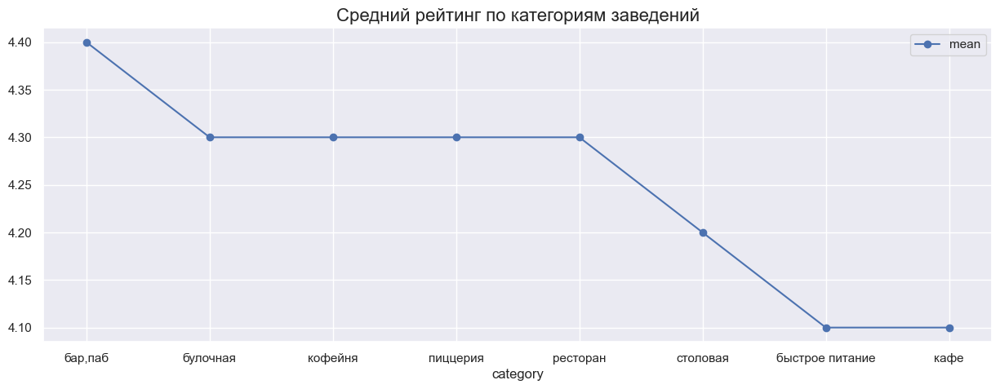

In [51]:
ax = rating_sorted.plot(title='Средний рейтинг по категориям заведений',
x='category', y='mean', kind='line', use_index=True, figsize=(15, 5), style ='o-')

ax.title.set_size(16)
ax.labels = rating_sorted['category']
plt.show()



#### Вывод 6:   
Сфера питания в среднем по всем категориям заведений имеет оценку более 4 по 5-балльной шкале. Это говорит о том, что в целом потребители удовлетворены качеством предоставляемых услуг. Но, тем не менее, в разных типах общепита средний уровень оценки различается. Более всего лояльность клиентов получают бары/пабы - 4.4, рестораны, булочные, кофейни и пиццерии имеют средний балл 4.3, столовые оцениваются на 4.2, кафе на 4.1, худший результат у организаций быстрого питания - 4 балла.

### Где поесть в Москве?

#### Фоновая картограмма (хороплет)  всех заведений исследования на карте 

In [52]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# картa Москвы
mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создание пустого кластера, добавление его на карту
marker_cluster = MarkerCluster().add_to(mm)

# функция, принимающая строку датафрейма, создает маркер в текущей точке и
# добавляет его в кластер marker_cluster

def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# применение функции к каждой строке датафрейма 
data.apply(create_cluster, axis=1)

# визуализация
mm

In [53]:
 # сводная таблица
rating_district = data_seats.pivot_table(
    index='district', values='rating', aggfunc=['mean']).reset_index().round(1)
rating_district.columns = ['district', 'mean']

rating_district = rating_district.sort_values(by = 'mean', ascending=False)
rating_district

,district,mean
5,Центральный административный округ,4.4
0,Восточный административный округ,4.2
1,Западный административный округ,4.2
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
7,Юго-Западный административный округ,4.2
8,Южный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.

In [54]:
# загрузка JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# карта Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создание хороплета с помощью конструктора Choropleth с добавлением на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# вывод карты YlGnBu YlOrBr
m

#### Вывод 7:   
Лучшие оценки получают заведения Центрального АО, также удовлетворённость клиентов поддерживают в Северном АО, хуже всего предлагают сервис в Юго-Восточном АО.

### Топ-15 улиц по количеству заведений. 

####  Распределение количества заведений и их категорий по улицам.

In [55]:
# получение данных по заведениям в порядке убывания
streets = data.groupby('street').agg({'name' : 'count', 'category' : pd.Series.mode, 'rating': 'median', 'chain' : 'sum',}).reset_index()
streets = streets.rename(columns={'name':'count'})
streets['district'] = data['district']
streets1 = streets.sort_values('count', ascending = False).head(15)
display(streets1) 

print(' ')
print('Количество заведений в ТОП-15 улиц -', round(sum(streets1['count']), 2), 'объектов.')
print(' ')
print('Доля заведений ТОП-15 улиц составляет', round(sum(streets1['count'])/len(data['name'])*100, 1), '% от общего количества.')
print(' ')
print('Доля сетевых заведений на 15 самых популярных улицах составляет', round(sum(streets1['chain'])/sum(streets1['count'])*100, 1), '%.')

,street,count,category,rating,chain,district
1187,проспект мира,184,кафе,4.20,70,Северо-Западный административный округ
1191,профсоюзная,122,кафе,4.30,55,Северо-Западный административный округ
1184,проспект вернадского,108,ресторан,4.30,58,Северо-Западный административный округ
883,ленинский проспект,107,ресторан,4.30,38,Северный административный округ
881,ленинградский проспект,95,"[кофейня, ресторан]",4.30,37,Северо-Восточный административный округ
729,дмитровское шоссе,88,ресторан,4.20,40,Северный административный округ
811,каширское шоссе,77,кафе,4.20,44,Северный административный округ
654,варшавское шоссе,76,ресторан,4.20,27,Северный административный округ
882,ленинградское шоссе,70,ресторан,4.30,31,Северо-Восточный административный округ
960,мкад,65,кафе,4.10,29,Северо-Восточный административный округ


 
Количество заведений в ТОП-15 улиц - 1258 объектов.
 
Доля заведений ТОП-15 улиц составляет 15.0 % от общего количества.
 
Доля сетевых заведений на 15 самых популярных улицах составляет 42.8 %.


#### Горизонтальный столбиковый график

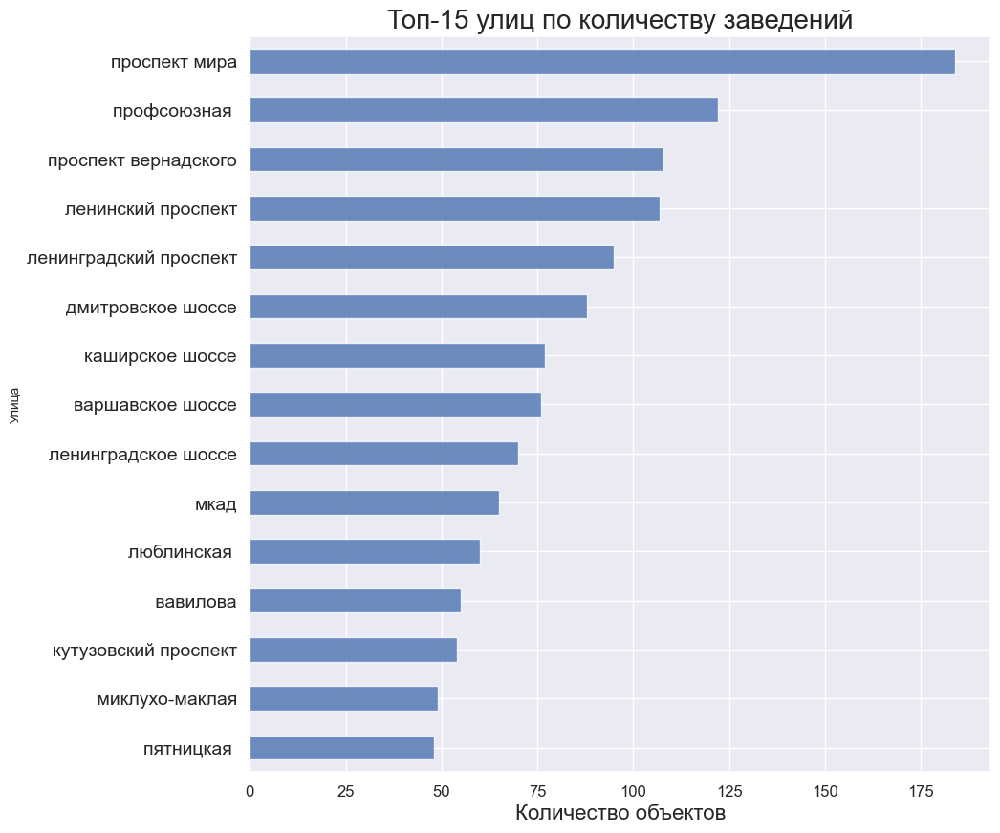

In [56]:
chart = streets1[['street', 'count']]
ax = chart.sort_index(key=chart.sum(axis=1).get, ascending=True).plot.barh (
    x='street', y='count', legend= False, alpha = 0.8, figsize=(10, 10))
ax.set_title('Топ-15 улиц по количеству заведений', fontsize=20)
ax.set_xlabel('Количество объектов', fontsize=16)
ax.set_ylabel('Улица', fontsize=10)
plt.xticks(fontsize=12)
plt.yticks(rotation=0, fontsize=14)
plt.show()


#### Вывод 8:   

Улицы с самым большим количеством точек общепита находятся в северной части столицы.  
На них всего расположено 1 258 объектов, их доля составляет 15% от всего количества заведений. Сети представлены на 43%.    
Категория объектов - кафе и рестораны.  
Количество объектов объясняется высоким траффиком, месторасположением, протяженностью улиц, преимущественно это проспекты, шоссе, также сюда попала МКАД.

### Улицы-аутсайдеры по количеству заведений. 

#### Сводка по округам.

In [57]:
# датасет с улицами, где имеется только 1 заведение общепита
streets_aut = streets[streets['count'] == 1]

# получение количества заведений каждой категории по районам
streets_aut_district = pd.pivot_table(streets_aut,
               index=['district'],
               values=['count'],
               columns=['category'],            
               aggfunc=['count']).reset_index()

streets_aut_district.columns = ['district', 'бар/паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
streets_aut_district 

,district,бар/паб,булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Западный административный округ,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN
1,Северный административный округ,15.0,2.0,5.0,68.0,27.0,4.0,32.0,13.0
2,Северо-Восточный административный округ,17.0,5.0,11.0,47.0,38.0,9.0,38.0,15.0
3,Северо-Западный административный округ,7.0,1.0,7.0,42.0,19.0,2.0,23.0,8.0


#### Улицы с одним объектом общепита.

In [58]:
# свод 
print(' ')
print('Количество улиц с 1 объектом общепита -', round(sum(streets_aut['count']), 2), '.')
print(' ')
print('Доля заведений на улицах с одной точкой составляет', round(sum(streets_aut['count'])/len(data['name'])*100, 1), '% от общего количества.')
print(' ')
print('Доля сетевых заведений на самых непопулярных улицах составляет', round(sum(streets_aut['chain'])/sum(streets_aut['count'])*100, 1), '%.')

 
Количество улиц с 1 объектом общепита - 457 .
 
Доля заведений на улицах с одной точкой составляет 5.4 % от общего количества.
 
Доля сетевых заведений на самых непопулярных улицах составляет 29.1 %.


#### Вывод 9:   
  
Улицы, где представлено по 1 объекту общепита, находятся в северной части столицы.  
Всего таких улиц - 457.  
Доля заведений, у которых нет никаких конкурентов в локации, составляет 5,4% от общего числа, из них доля сетей 29%.  
Более всего на таких улицах работают кафе, рестораны или кофейни.  
Это могут быть улицы с низким траффиком людей, промышленные зоны, либо улицы спальных районов.

### Анализ средних чеков заведений. 

#### Медианые значения оценки одной чашки капучино для каждого района.

In [59]:
data_avg_bill = data[data['middle_avg_bill'] != 'NaN']
avg_bill = data_avg_bill.groupby('district')['middle_avg_bill'].median().reset_index().sort_values(
    by = 'middle_avg_bill', ascending=False)
avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


#### Фоновая картограмма (хороплет) ценового индикатора каждого района.

In [60]:
# карта Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth с добавлением на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Цновая индикация по административным округам',
).add_to(m1)

# вывод карты YlGnBu YlOrBr
m1

#### Вывод 10:  
Самый высокий средний чек в Центральном и Западном административных округах.  
Уровень среднего чека в центре объясним - это туристы, деловые и гос.служащие люди, наличие заведений премиум-сегмента. 
В центральном районе проживает много состоятельных людей.  
В Западном АО также много ресторанов и кафе с высоким цеником, что говорит об обеспеченности посетителей в этом районе. В нём же  находится московский деловой центр Москва-Сити.  
Дешевле всего можно поесть в Северо-Восточном, Южном и Юго-Восточнои административных округах.

### Взаимосвязи: режим работы, локация, категории.

In [61]:
# датасеты с фильтрацией по режиму работы
data_link1 = data[data['is_24/7'] == True]   # круглосуточно
data_link2 = data[data['is_24/7'] != True]   # не круглосуточно


In [62]:
print('Количество заведений с круглосуточным режимом работы -', len(data[data['is_24/7'] == True]), '.')
print(' ')
print('Доля заведений с круглосуточным режимом работы -', round((len(data[data['is_24/7'] == True])/len(data['is_24/7'])*100), 1), '%.')
print(' ')
print('Доля посадочных мест в объектах с круглосуточным режимом работы -', round((sum(data_link1['seats'])/sum(data['seats'])*100), 1), '%.')

Количество заведений с круглосуточным режимом работы - 730 .
 
Доля заведений с круглосуточным режимом работы - 8.7 %.
 
Доля посадочных мест в объектах с круглосуточным режимом работы - nan %.


In [63]:
# получение данных по округам в порядке убывания по доле
link_distr = data_link1.groupby('district').agg({'is_24/7' : 'count'})
link_distr = link_distr.rename(columns={'is_24/7':'24/7'})
link_distr['other'] = data_link2.groupby('district').agg({'is_24/7' : 'count'})
link_distr = link_distr.reset_index()

link_distr['fraction_24/7,%'] = round(link_distr['24/7'] / (link_distr['24/7']+link_distr['other']) *100, 2)

display(link_distr.sort_values('fraction_24/7,%', ascending = False)) 

,district,24/7,other,"fraction_24/7,%"
6,Юго-Восточный административный округ,93,621,13.03
0,Восточный административный округ,97,701,12.16
4,Северо-Западный административный округ,43,366,10.51
7,Юго-Западный административный округ,73,636,10.30
1,Западный административный округ,72,779,8.46
3,Северо-Восточный административный округ,75,816,8.42
8,Южный административный округ,75,817,8.41
2,Северный административный округ,71,827,7.91
5,Центральный административный округ,131,2111,5.84


In [64]:
# получение данных по категориям заведений в порядке убывания по доле
link_categ = data_link1.groupby('category').agg({'is_24/7' : 'count'})
link_categ = link_categ.rename(columns={'is_24/7':'24/7'})
link_categ['other'] = data_link2.groupby('category').agg({'is_24/7' : 'count'})
link_categ = link_categ.reset_index()

link_categ['fraction_24/7,%'] = round(link_categ['24/7'] / (link_categ['24/7']+link_categ['other']) *100, 2)

display(link_categ.sort_values('fraction_24/7,%', ascending = False)) 

,category,24/7,other,"fraction_24/7,%"
2,быстрое питание,150,453,24.88
3,кафе,267,2110,11.23
1,булочная,24,232,9.38
0,"бар,паб",52,713,6.80
6,ресторан,135,1907,6.61
5,пиццерия,31,602,4.90
4,кофейня,59,1354,4.18
7,столовая,12,303,3.81


#### Вывод 11:   
  
Заведений с круглосуточным режимом работе немного - примерно 9% от всего числа объектов общепита, это 7% посадочных мест.  
Более всего в категории быстрого питания, примерно четверть готовы оказывать услуги 24/7.  
Только в 11% кафе можно поесть в любое время.  
Меньше всего круглосуточных заведений в категории столовых, скорее всего, это столовые при больших предприятиях или рядом с местами пассажирских перевозок.  
Если анализировать по административным округам, то меньше всего круглосуточных заведений в ЦАО, что подтверждает версию о том, что наибольшая востребованность получения услуг общепита в ночное время в округах, где сосредоточены промышленные, рабочие объекты или места, где имеется непрерывный траффик людей.

### Общий вывод по блоку.

- В проведённом исследовании участвовало 5 512 юридический образований, это 8 404 заведений.  .  
- Самые распространённые категории объектов: кафе (28%), рестораны (24%), кофейни (17%), меньше всего столовых и булочных - 3-4%.   
- Рестораны рассчитаны в среднем на 90 посадочных мест, также много мест в барах (84), кофейнях и столовых (80). Самые малочисленные пиццерии (56) и булочные (52).  
- Доля сетей в сфере общепита 38%. Владельцы сетей также предпочитают формат кафе и ресторанов.  
- Самой популярным заведением является кофейня "Шоколадница", в Москве расположено 120 точек, они имеют средний рейтинг у покупателей (4.2 балла)  
- ТОП-15 организаций общепита Москвы - это почти 10% всего рынка в этой сфере.  Он представлен ресторанами, кафе, кофейней. Также сюда попала самая распространённая сеть булочных "Буханка".  
-  В целом общепит в административных округах преимущественно представлен кафе, ресторанами и кофейнями. 27% объектов находятся в ЦАО, где больше всего туристов, сосредоточена деловая активность города. Также центр отличается самой большой долей баров/пабов, их популярность подтверждается и самой высокой средней оценкой посетителей (4.4 балла).    
- Сфера питания в среднем по всем категориям заведений имеет оценку более 4 по 5-балльной шкале. Но, тем не менее, в разных типах общепита средний уровень оценки различается, булочные, кофейни и пиццерии имеют средний балл 4.3, столовые оцениваются на 4.2, кафе на 4.1, худший результат у организаций быстрого питания - 4 балла.  
- Лучшие оценки получают заведения Центрального АО, также удовлетворённость клиентов поддерживают в Северном АО, хуже всего предлагают сервис в Юго-Восточном АО.  
- 457 улиц имеют всего по одной точке общепита и все они расположены в северной части столицы. Их доля составляет 5,4% от общего числа заведений, это кафе, рестораны или кофейни. 
- Самый высокий средний чек (1000 руб.) в Центральном и Западном административных округах. Дешевле всего можно поесть в Северо-Восточном, Южном и Юго-Восточнои административных округах.  
- Заведений с круглосуточным режимом работе немного - примерно 9% от всего числа объектов общепита, это 7% посадочных мест. Преобладают объекты быстрого питания, примерно четверть их оказывают услуги 24/7.  
- Меньше всего круглосуточных заведений в ЦАО, т.к. наибольшая востребованность получения услуг общепита в ночное время в округах, где сосредоточены промышленные, рабочие объекты или места, где имеется непрерывный траффик людей.  

## Часть 4. Детализация исследования: открытие кофейни

### Исследование рынка кофеен

#### Сколько всего кофеен в датасете?

In [65]:
coffee_house = data[data['category'] == 'кофейня']
print('Количество кофеен в исследовании:', len(coffee_house))
print(' ')
print('Доля кофеен от общего числа заведений общепита -', round(len(coffee_house)/len(data['name'])*100, 1), '%.')


Количество кофеен в исследовании: 1413
 
Доля кофеен от общего числа заведений общепита - 16.8 %.


#### В каких районах их больше всего, каковы особенности их расположения?

In [66]:
coffee_district = pd.DataFrame(data_district, columns=['district', 'кофейня']).sort_values(by = 'кофейня', ascending=False)
coffee_district

,district,кофейня
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


#### Режим работы. Есть ли круглосуточные кофейни?

In [67]:
coffee_house_24 = len(coffee_house[coffee_house['is_24/7'] == True])
print('Количество кофеен с круглосуточным режимом работы -', coffee_house_24, '.')
print(' ')
print('Доля кофеен с круглосуточным режимом работы -', round(coffee_house_24/len(coffee_house)*100, 1), '%.')

Количество кофеен с круглосуточным режимом работы - 59 .
 
Доля кофеен с круглосуточным режимом работы - 4.2 %.


#### Средний чек заведения. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [68]:
coffee_avg_bill = coffee_house[coffee_house['middle_avg_bill'] != 'NaN']
avg_bill_coffee = coffee_avg_bill.groupby('district')['middle_avg_bill'].median().reset_index().sort_values(
    by = 'middle_avg_bill', ascending=False)
display(avg_bill_coffee)
print('Средний уровень чека для кофеен', round(avg_bill_coffee['middle_avg_bill']. median (), 1), 'руб.')

,district,middle_avg_bill
1,Западный административный округ,600.0
5,Центральный административный округ,500.0
0,Восточный административный округ,400.0
8,Южный административный округ,387.5
7,Юго-Западный административный округ,375.0
2,Северный административный округ,325.0
3,Северо-Восточный административный округ,325.0
4,Северо-Западный административный округ,325.0
6,Юго-Восточный административный округ,250.0


Средний уровень чека для кофеен 375.0 руб.


In [69]:
coffee_cup = data[data['middle_coffee_cup'] != 'NaN']
coffee_avg_cup = coffee_cup.groupby('district')['middle_coffee_cup'].median().reset_index().sort_values(
    by = 'middle_coffee_cup', ascending=False)
display(coffee_avg_cup)

print('Средний уровень чашки капучино для кофеен', round(coffee_avg_cup['middle_coffee_cup']. median (), 1), 'руб.')

,district,middle_coffee_cup
7,Юго-Западный административный округ,197.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
4,Северо-Западный административный округ,150.0
8,Южный административный округ,149.5
6,Юго-Восточный административный округ,145.0
0,Восточный административный округ,135.0


Средний уровень чашки капучино для кофеен 159.0 руб.


#### Рейтинги и локация. Какие у кофеен рейтинги? 

In [70]:
 # сводная таблица
rating_coffee_house = coffee_house.pivot_table(
    index='district', values='rating', aggfunc=['mean']).reset_index().round(1)
rating_coffee_house.columns = ['district', 'mean']

rating_coffee_house = rating_coffee_house.sort_values(by = 'mean', ascending=False)
rating_coffee_house

,district,mean
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
7,Юго-Западный административный округ,4.3
1,Западный административный округ,4.2
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2
8,Южный административный округ,4.2


### Визуализация

#### Как кофейни распределяются по районам?

In [71]:
# создание карты
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(m2)

# функция, которая принимает строку датафрейма, создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применение функции create_clusters() к каждой строке df
coffee_house.apply(create_clusters, axis=1)

# визуализация кофеен на карте
m2

### Вывод и рекомендации.  
В Москве 1 413 кофеен, что составляет 17% от всех заведений общепита. Такой показатель говорит о популярности подобного формата заведений у людей.    

Основателям фонда «Shut Up and Take My Money» стоит осуществить свою давнюю мечту и открыть кофейню.  
Так как они вдохновляются сериалом «Друзья» и хотят иметь такую же крутую и доступную, как «Central Perk», кофейню в Москве и, тем более, они не боятся конкуренции в этой сфере, то им стоит ориентироваться на молодёжную аудиторию.  

Рекомендованные локации - это места рядом с крупными ВУЗами (МГУ, Бауманка, ВШЭ и т.п), рассчитанные на аудиторию студентов, молодых преподавателей и не только. Не стоит стремиться в самый центр, достаточно, если это просто будет место с хорошим траффиком людей.  
  
Т.к. студенты могут посещать эти заведения компаниями, то количество посадочных мест должно быть не меньше 80 (это медианный показатель по данной категории).  
  
Режим работы НЕ круглосуточный, но время работы должно удовлетворять потребность в лёгком завтраке перед занятиями (н-р, кофе + круассан), а также возможность отдохнуть и пообщаться с друзьями после учёбы. Допустим с 8.00 до 23.00 (или с 7.30 до 22.00).  
  
Ориентировочный средний уровень чека для кофеен 375.0 руб., но вполне реально работать над его повышением (это обусловлено обслуживанием больших студенческих компаний), при этом средняя стоимость чашки капучино не должна быть выше среднего показателя по кофейням - 160 руб.  
  
Оценка кофеен в Москве в среднем выше 4.2 баллов. Значит посетители требовательны к уровню сервиса и стоит быть готовыми к конкуренции и предоставлению услуг высокого качества.  
  
Концептуальная задача - оригинальная современная обстановка, при этом функциональная и простая. Необходима разрабоика грамотной маркетинговой стратегии с применением креативных решений, которые будут цеплять молодую студенческую публику.  

# Часть 5. Подготовка презентации

### Презентация: https://github.com/Alla-Kuhtenko/Portfolio_YP/blob/main/public-catering-moscow-places/public-catering-moscow-places.pdf